In [1]:
## This version excludes CONTINUOUS Variables and the RFD variables AND _wHICH VARIABLES 3/27/2024 and con_max_consultorder_time/day and drg name
## 4/4/2024 Added QUINTILE variables
## 4/8/2024 Added QUINTILE varables by service
## 4/9/2024 Added more consult and imaging variables (e.g. ad,it order to consult order, admit order to imaging read)
## 4/11/2024 Added QUINTILE variables by service for the additional variables
## 4/13/2024 Added con_unique_services_which and con_unique_services_which2 variables

In [2]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, SmartCorrelatedSelection
from feature_engine.encoding import OneHotEncoder
from feature_engine.selection import DropFeatures, DropConstantFeatures, DropDuplicateFeatures, SmartCorrelatedSelection
from feature_engine.imputation import AddMissingIndicator
from feature_engine.outliers import Winsorizer
from sklearn.preprocessing import MinMaxScaler
from feature_engine.discretisation import DecisionTreeDiscretiser
from sklearn.model_selection import GroupShuffleSplit

from feature_engine.wrappers import SklearnTransformerWrapper
from feature_engine.imputation import ArbitraryNumberImputer
from feature_engine.imputation import MeanMedianImputer
from feature_engine.imputation import CategoricalImputer
from feature_engine.encoding import RareLabelEncoder
from sklearn.impute import SimpleImputer

#pip install xgboost==0.90
import xgboost as xgb
import plotly.express as px
import shap

#https://github.com/liannewriting/YouTube-videos-public/blob/main/xgboost-python-tutorial-example/xgboost_python.ipynb
from category_encoders.target_encoder import TargetEncoder
from xgboost import XGBClassifier
#hyperparameter values
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, f1_score, roc_auc_score, classification_report, precision_recall_curve
from sklearn.calibration import calibration_curve

import warnings
warnings.filterwarnings('ignore')

In [3]:
df_all = pd.read_csv('/gpfs/milgram/project/rtaylor/imc33/data/clean/master_los.csv', index_col=[0])

In [4]:
pd.set_option('display.max_columns', None)

In [5]:
df_all["viz_service_collapsed"].value_counts()

viz_service_collapsed
Medicine             10055
Cardiology            1671
Neurology              888
Surgical Services      429
Name: count, dtype: int64

In [6]:
df_all["viz_disp_collapsed"].value_counts()

viz_disp_collapsed
Other    8229
Home     4814
Name: count, dtype: int64

In [7]:
df_all["thro_boarding_yn"].value_counts()

thro_boarding_yn
1.0    6825
0.0    5498
Name: count, dtype: int64

In [8]:
df_all["viz_drg"].value_counts()

viz_drg
Septicemia or severe sepsis w/o mv >96 hours w mcc                                           2060
heart failure & shock w mcc                                                                  1372
Respiratory infections & inflammations w mcc                                                 1056
Esophagitis, gastroent & misc digest disorders w/o mcc                                        678
Simple pneumonia & pleurisy w mcc                                                             627
Cellulitis w/o mcc                                                                            454
Septicemia or severe sepsis w/o mv >96 hours w/o mcc                                          437
Renal failure w mcc                                                                           426
Pulmonary edema & respiratory failure                                                         425
Infectious & parasitic diseases w o.r. procedure w mcc                                        352
Intracranial

In [9]:
df_all["con_unique_services_which2"].value_counts()

con_unique_services_which2
Multiple                                5990
Cardiology                               516
Pharmacy                                 482
Gastroenterology                         472
Neurology                                389
Nephrology                               360
Diabetes                                 155
Pulmonology                              150
Addiction Medicine                       142
Surgery                                  129
Palliative                               125
Psychiatry                               123
Geriatrics                               120
Hospitalist Service                      101
Infectious Disease                        76
Urology                                   75
Other                                     72
Oncology                                  68
Hematology                                59
Orthopedics                               57
ICU/SDU                                   50
Podiatry                    

In [10]:
#Filter for home patients
#df_filt = df_all.copy()
df_filt = df_all[df_all["con_unique_services_which2"]=="Diabetes"].copy()
#df_filt = df_all[df_all["viz_service_collapsed"]=="Neurology"]
#df_filt = df_all[df_all["viz_drg"]=="heart failure & shock w mcc"].copy()
#df_filt = df_all[df_all["viz_disp_collapsed"] == "Home"].copy()
#df_filt = df_all[df_all["thro_boarding_yn"] == 1].copy()

In [11]:
#df_filt.shape

In [12]:
# aitc_features.xlsx includes all the feature names and corresponding types
features_los = pd.read_excel('/gpfs/milgram/project/rtaylor/imc33/data/clean/features_los.xlsx')

# Features that are divided into 5 types to conduct data preprocessing
# 1. drop: features that need to be dropped
drop_list = features_los[features_los['type'] == 'drop']['col_name'].tolist()

# 2. category: features that are already categorical and need to be OneHotEncoding (add missing value indicator, impute missing by adding 'missing' category)
category_list = features_los[features_los['type'] == 'category']['col_name'].tolist()

# 3. binary: features that are binary and need to be converted to categorical (add missing value indicator / prefer: fill missing with 0)
binary_list = features_los[features_los['type'] == 'binary']['col_name'].tolist()

# 4. continuous: features that are continous/numerical variables, need outlier handling and normalization (add missing value indicator, fill missing with median)
continuous_list = features_los[features_los['type'] == 'continuous']['col_name'].tolist()

# 5. discrete: features that are discrete/numerical variables, need to be discretized (fill missing with 0)
discrete_list = features_los[features_los['type'] == 'discrete']['col_name'].tolist()

In [13]:
# Identify variables with infinite values
#variables_with_inf = df_filt.columns[df_filt.isin([np.inf, -np.inf]).any()]

# Handle infinite values (e.g., replace with NaN)
#df_filt[variables_with_inf] = df_filt[variables_with_inf].replace([np.inf, -np.inf], np.nan)

In [14]:
# Split into X, y
X = df_filt.drop(['viz_outcome_prolonged_los_yn'], axis=1)
y = df_filt['viz_outcome_prolonged_los_yn']

In [15]:
# Convert variables to categorical
X[binary_list] = X[binary_list].astype('category')
X[category_list] = X[category_list].astype('category')

In [16]:
# Drop features that have >= 99% missing values And features in drop list
missing_pct = X.isnull().mean() * 100
cols_to_drop = missing_pct[missing_pct >= 99].index.tolist()
#final_drop_list = list(set(drop_list + cols_to_drop))
#X_1b = X_1b.drop(columns=final_drop_list)
#X_1b = X_1b.reset_index(drop=True)
#y_1b = y_1b.reset_index(drop=True)

In [17]:
pd.set_option('display.max_rows', 400)

In [18]:
missing_pct.reset_index().sort_values(0, ascending=False).head()

,index,0
914,img_avg_admit_order_to_imaging_read_echo_quintile,100.0
910,img_avg_admit_order_to_imaging_read_echo_hrs,100.0
906,img_avg_admit_order_to_imaging_order_echo_quin...,100.0
902,img_avg_admit_order_to_imaging_order_echo_hrs,100.0
867,img_max_admit_order_to_imaging_order_echo_hrs,100.0


In [19]:
continuous_list.remove("viz_age")

In [20]:
# We do NOT want to drop these
#cols_to_drop
#only these
drop_list

['rfd_first_nmr_start_day',
 'rfd_first_nmr_start_time',
 'rfd_first_mrnb_start_day',
 'rfd_first_mrnb_start_time',
 'rfd_first_mrwb_start_day',
 'rfd_first_mrwb_start_time',
 'rfd_last_nmr_effective_end_day',
 'rfd_last_nmr_effective_end_time',
 'rfd_last_mrnb_effective_end_day',
 'rfd_last_mrnb_effective_end_time',
 'rfd_last_mrwb_effective_end_day',
 'rfd_last_mrwb_effective_end_time',
 'con_max_consult_order_to_sign_which',
 'con_max_consult_order_time',
 'con_max_consult_order_day',
 'con_max_date_note_signed_time1',
 'con_max_date_note_signed_day1',
 'con_max_consult_note_to_sign_which',
 'admissiondate',
 'ed_arrival_time',
 'ed_arrival_hour',
 'ed_arrival_date',
 'dischargedate',
 'con_max_consult_order_to_sign_colon_and_rectal_hrs',
 'con_max_consult_order_to_sign_picc_hrs',
 'con_max_consult_order_to_sign_pharmacy_hrs',
 'con_max_consult_order_to_sign_sw_hrs',
 'con_max_admit_order_to_consult_order_any_hrs',
 'con_avg_admit_order_to_consult_order_any_hrs',
 'img_max_admit_ord

In [21]:
X

admissiondate dischargedate pat_mrn_id  \
pat_enc_csn_id                                          
308438708         2022-12-26    2023-01-03  MR1561472   
308668318         2022-12-29    2023-01-03  MR1572022   
308873819         2022-12-31    2023-01-03  MR5698732   
309064581         2023-01-03    2023-01-06  MR2419088   
309531725         2023-01-08    2023-01-14  MR3826348   
309834944         2023-01-10    2023-01-20  MR5856556   
310275464         2023-01-15    2023-01-18  MR2566519   
310307250         2023-01-16    2023-01-27   MR361873   
310471174         2023-01-17    2023-01-28   MR158332   
311340219         2023-01-25    2023-01-27  MR1804885   
311937470         2023-02-01    2023-02-05  MR2490467   
312328861         2023-02-04    2023-02-08  MR3237408   
313036110         2023-02-10    2023-02-16   MR361873   
314011532         2023-02-21    2023-02-24  MR1062545   
313992975         2023-02-21    2023-02-25  MR2319310   
314424974         2023-02-25    2023-03-03  MR3504053   
314995064         2023-03-02    2023-03-05  MR3941010   
315152422         2023-03-05    2023-03-14  MR6474956   
315447486         2023-03-07    2023-03-11    MR95958   
315726221         2023-03-10    2023-03-16  MR1246373   
315812748         2023-03-10    2023-03-19  MR5140665   
315856880         2023-03-11    2023-03-21  MR1830962   
315970730         2023-03-13    2023-03-17  MR6707963   
316558594         2023-03-19    2023-03-22  MR6909107   
316885389         2023-03-22    2023-03-24  MR4441661   
317726808         2023-03-30    2023-04-02  MR2065084   
318085715         2023-04-04    2023-04-10  MR7167849   
318341513         2023-04-05    2023-04-12  MR2046644   
318472747         2023-04-06    2023-04-10  MR1317236   
318471863         2023-04-06    2023-04-11  MR1813876   
318593355         2023-04-09    2023-04-11  MR2042518   
318725369         2023-04-10    2023-04-16  MR2837051   
319095476         2023-04-13    2023-04-21  MR1053379   
319168722         2023-04-14    2023-04-16  MR1801328   
319211865         2023-04-15    2023-04-17  MR3102678   
319225388         2023-04-15    2023-04-23   MR123615   
319249674         2023-04-16    2023-04-20  MR2221234   
319499818         2023-04-18    2023-04-21  MR2138678   
319932095         2023-04-23    2023-04-25  MR2127556   
319927846         2023-04-23    2023-04-26  MR4648406   
320078216         2023-04-24    2023-04-27  MR1166752   
319995397         2023-04-24    2023-04-28    MR13281   
320189481         2023-04-25    2023-04-28  MR2600405   
320219325         2023-04-25    2023-04-30  MR5841608   
320153685         2023-04-25    2023-05-05  MR5706852   
320697402         2023-04-30    2023-05-05  MR2192227   
321096522         2023-05-03    2023-05-06  MR1062545   
321246788         2023-05-04    2023-05-09  MR3988325   
321394602         2023-05-06    2023-05-14    MR61309   
321399500         2023-05-07    2023-05-15   MR721493   
321517552         2023-05-08    2023-05-11  MR1646310   
321567534         2023-05-09    2023-05-13  MR2295016   
321953278         2023-05-11    2023-05-17  MR1693673   
322249297         2023-05-15    2023-05-18  MR2163804   
323082150         2023-05-24    2023-05-28  MR1404150   
323377773         2023-05-26    2023-05-28  MR5935582   
323343680         2023-05-26    2023-05-30  MR1050560   
323449777         2023-05-26    2023-05-30  MR7045415   
323416182         2023-05-26    2023-06-01  MR4882351   
323466730         2023-05-27    2023-05-30  MR2553185   
323490757         2023-05-29    2023-05-31  MR4001383   
323488078         2023-05-29    2023-06-02   MR194267   
323623871         2023-05-30    2023-06-02  MR1774741   
324033069         2023-06-02    2023-06-05  MR4171427   
323940059         2023-06-02    2023-06-09  MR7202146   
324039464         2023-06-03    2023-06-12  MR5650598   
324084110         2023-06-05    2023-06-09  MR6274032   
324272640         2023-06-06    2023-06-08    MR80011   
324310580         2023-06

In [22]:
X = X.drop(columns=drop_list+continuous_list)
X = X.reset_index()
y = y.reset_index()

In [23]:
# Split the data by group shuffle split on 'PAT_MRN_ID' into train set and validation set
gss = GroupShuffleSplit(n_splits=2, test_size=0.2, random_state=42)

train_ix, val_ix = next(gss.split(X, y, groups=X['pat_mrn_id']))

X_train = X.loc[train_ix]
y_train = y.loc[train_ix]

X_val = X.loc[val_ix]
y_val = y.loc[val_ix]

# Drop 'PAT_MRN_ID' and set 'PAT_ENC_CSN_ID' as index
X_train = X_train.drop(['pat_mrn_id'], axis=1).set_index('pat_enc_csn_id')
X_val = X_val.drop(['pat_mrn_id'], axis=1).set_index('pat_enc_csn_id')

### Feature Processing

In [24]:

# Update feature preprocessing pipeline
feature_preprocess_pipeline = Pipeline(steps=[

    # Missing value indicator for categoricals and continuous variables
    #('missing_indicator', AddMissingIndicator(variables=category_list + continuous_list)),

    # Missing value imputation
    # Impute missing values with 0 for discrete variables
    ('arbitrary_number_imputer', ArbitraryNumberImputer(arbitrary_number=0, variables=discrete_list)),

  
    # Impute missing values with adding 'missing' category for categorical variables 
   ('categorical_imputer', CategoricalImputer(variables=category_list)),

    # Impute missing values with 0 for binary variables 
    ('binary_imputer', CategoricalImputer(fill_value='0', variables=binary_list)),

    
    # Rare encoding for categorical variables
    ('rare_label_encoder', RareLabelEncoder(tol=0.01, n_categories=5, max_n_categories=10, variables=category_list)),

    # OneHotEncoding for categoricals
    ('one_hot_category', OneHotEncoder(variables=category_list)),

    # Outlier handling & normalization for continous variables
   #('outlier_handling', Winsorizer(capping_method='gaussian', tail='right', fold=3, variables=continuous_list)),
    #todo: 

  # ('normalize', SklearnTransformerWrapper(MinMaxScaler(feature_range=(0, 1)), variables=continuous_list)),

    # discretize for discrete variables
   #('discretize', DecisionTreeDiscretiser(cv=3, scoring='roc_auc', regression=False, random_state=42, variables=discrete_list))
    #todo:
    
])  # Apply the pipeline

In [25]:
# Apply the pipeline
X_train_preprocessed = feature_preprocess_pipeline.fit_transform(X_train, y_train)
X_val_preprocessed = feature_preprocess_pipeline.transform(X_val)

In [26]:
X_train_preprocessed.shape

(125, 907)

In [27]:
X_train_preprocessed.to_csv('/gpfs/milgram/project/rtaylor/imc33/data/pipeline/los_train_preprocessed_byservice_patients_cat_only.csv')
X_val_preprocessed.to_csv('/gpfs/milgram/project/rtaylor/imc33/data/pipeline/los_val_preprocessed_byservice_patients_cat_only.csv')

### Feature Selection

In [28]:
# 1st Feature Selection pipeline
feature_selection_pipeline = Pipeline(steps=[

        ('drop_constant', DropConstantFeatures(tol=0.99)),

        ('drop_duplicates', DropDuplicateFeatures()),

        ('correlated_features', SmartCorrelatedSelection(
        method='pearson',
        threshold=0.9,
        selection_method='model_performance',
        estimator=xgb.XGBClassifier(random_state=0)
        ))
])

In [29]:
miss_df = X_train_preprocessed.isna().sum().reset_index()
miss_df[miss_df[0]>0]
miss_df[miss_df[0]>0].to_csv("miss_df.csv", index=False)

In [30]:
# Apply the pipeline
X_train_selected = feature_selection_pipeline.fit_transform(X_train_preprocessed, y_train['viz_outcome_prolonged_los_yn'])
X_val_selected = feature_selection_pipeline.transform(X_val_preprocessed)

In [31]:
X_train_selected.to_csv('/gpfs/milgram/project/rtaylor/imc33/data/pipeline/los_train_initial_selected_byservice_patients_cat_only.csv')
X_val_selected.to_csv('/gpfs/milgram/project/rtaylor/imc33/data/pipeline/los_val_initial_selected_byservice_patients_cat_only.csv')

In [32]:
X_train_preprocessed.shape

(125, 907)

In [33]:
X_train_selected.shape

(125, 336)

In [34]:
# Read files
#X_train_selected = pd.read_csv('/gpfs/milgram/project/rtaylor/imc33/data/pipeline/los_train_initial_selected_byservice_patients_cat_only.csv')
#X_val_selected = pd.read_csv('/gpfs/milgram/project/rtaylor/imc33/data/pipeline/los_val_initial_selected_byservice_patients_cat_only.csv')

In [35]:
#train_selected = X_train_selected.merge(y_train, on='pat_enc_csn_id', how='left')
#val_selected = X_val_selected.merge(y_val, on='pat_enc_csn_id', how='left')

In [36]:
#train_selected = train_selected.set_index('pat_enc_csn_id')
#val_selected = val_selected.set_index('pat_enc_csn_id')

In [37]:
# Top 20 features - training set
#get_best_features(num_feats = 20, df = train_selected, df_name = 'train', target = 'viz_outcome_prolonged_los_yn')

In [38]:
y_train['viz_outcome_prolonged_los_yn'].sum()/y_train.shape[0]

0.528

In [39]:
estimators = [
    ('encoder', TargetEncoder()),
    ('clf', XGBClassifier(random_state=8, verbosity=1))
]

tuning_pipeline = Pipeline(steps=estimators)

In [40]:
search_space = {
    'clf__max_depth': Integer(2,8),
    'clf__learning_rate': Real(0.001, 1.0, prior='log-uniform'),
    'clf__subsample': Real(0.5, 1.0),
    'clf__colsample_bytree': Real(0.5, 1.0),
    'clf__colsample_bylevel': Real(0.5, 1.0),
    'clf__colsample_bynode' : Real(0.5, 1.0),
    'clf__reg_alpha': Real(0.0, 10.0),
    'clf__reg_lambda': Real(0.0, 10.0),
    'clf__gamma': Real(0.0, 10.0)
}

model_xgb = BayesSearchCV(tuning_pipeline, search_space, cv=3, n_iter=10, scoring='roc_auc', random_state=8) 

In [41]:
#y_train = y_train.set_index('pat_enc_csn_id')

In [42]:
y_train = y_train.set_index('pat_enc_csn_id')

In [43]:
#X_train_selected = X_train_selected.set_index('pat_enc_csn_id')

In [44]:
model_xgb.fit(X_train_selected,  y_train)

BayesSearchCV(cv=3,
              estimator=Pipeline(steps=[('encoder', TargetEncoder()),
                                        ('clf',
                                         XGBClassifier(base_score=None,
                                                       booster=None,
                                                       callbacks=None,
                                                       colsample_bylevel=None,
                                                       colsample_bynode=None,
                                                       colsample_bytree=None,
                                                       device=None,
                                                       early_stopping_rounds=None,
                                                       enable_categorical=False,
                                                       eval_metric=None,
                                                       feature_types=None,
                                                       gamma=None,
                                                       grow_policy=None,
                                                       importance_type=N...
                             'clf__learning_rate': Real(low=0.001, high=1.0, prior='log-uniform', transform='normalize'),
                             'clf__max_depth': Integer(low=2, high=8, prior='uniform', transform='normalize'),
                             'clf__reg_alpha': Real(low=0.0, high=10.0, prior='uniform', transform='normalize'),
                             'clf__reg_lambda': Real(low=0.0, high=10.0, prior='uniform', transform='normalize'),
                             'clf__subsample': Real(low=0.5, high=1.0, prior='uniform', transform='normalize')})

In [45]:
model_xgb.best_estimator_

Pipeline(steps=[('encoder',
                 TargetEncoder(cols=['thro_boarding_yn',
                                     'con_max_consult_order_to_sign_is_signer_ym_provider_yn',
                                     'con_max_consult_order_to_sign_is_signer_nemg_provider_yn',
                                     'con_max_consult_order_to_sign_is_signer_community_provider_yn',
                                     'con_max_consult_note_to_sign_is_signer_ym_provider_yn',
                                     'con_max_consult_note_to_sign_is_signer_nemg_pro...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.0031574039841631043,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=8, ...))])

In [46]:
model_xgb.best_score_

0.5027113237639553

In [47]:
y_val = y_val.set_index('pat_enc_csn_id')

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Confusion Matrix

-- Of 5831 people who did not have a prolonged LOS, 5831 (86%) were correctly classified.
-- Of 4724 people who did have prolonged LOS, 3918 (83%) were correctly classified

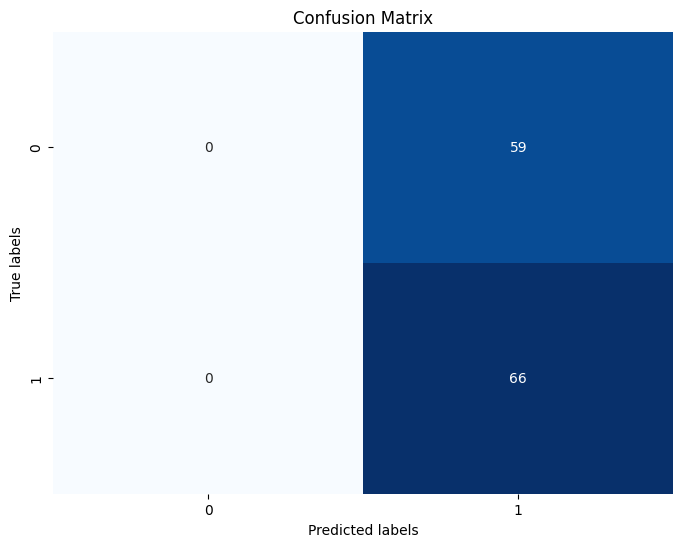

In [49]:
# Generate confusion matrix
cm = confusion_matrix(y_train, model_xgb.predict(X_train_selected))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [50]:
from sklearn import metrics

def buildROC(target_test,test_preds):
    fpr, tpr, threshold = metrics.roc_curve(target_test, test_preds)
    roc_auc = metrics.auc(fpr, tpr)
    plt.title('ROC Curve')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.gcf().savefig('roc.png')

In [51]:
test_preds = model_xgb.predict(X_val_selected)
target_test = y_val['viz_outcome_prolonged_los_yn']

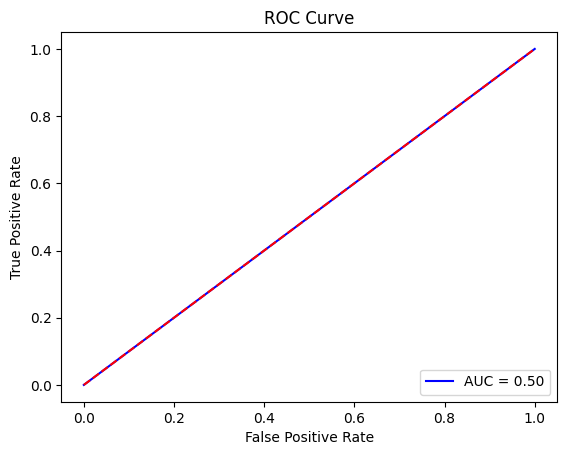

In [52]:
buildROC(target_test, test_preds)

In [53]:
def buildPR(target_test,test_preds):
    precision, recall, _ = metrics.precision_recall_curve(target_test, test_preds)
    pr_auc = metrics.auc(recall, precision)
    plt.title('PR Curve')
    plt.plot(recall, precision, label=f'PR-AUC = {pr_auc:.2f})')
    plt.legend(loc = 'lower right')
    plt.xlabel('Recall')
    plt.ylabel('Precision')

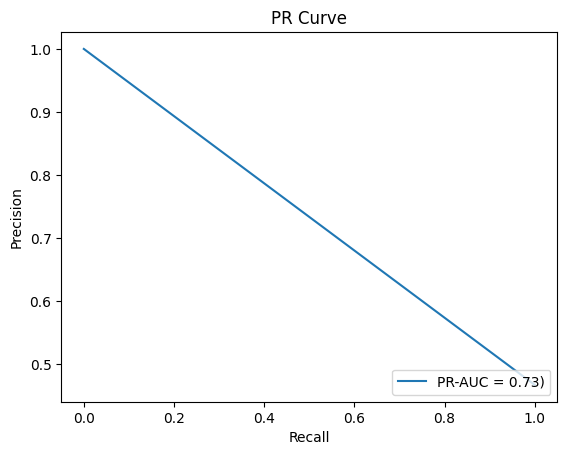

In [54]:
buildPR(target_test, test_preds)

In [55]:
def buildCC(target_test,test_preds):
      prob_true, prob_pred = calibration_curve(target_test, test_preds, n_bins=10)
      plt.plot(prob_pred, prob_true)
      plt.xlabel('Mean Predicted Probability')
      plt.ylabel('Fraction of Positives')

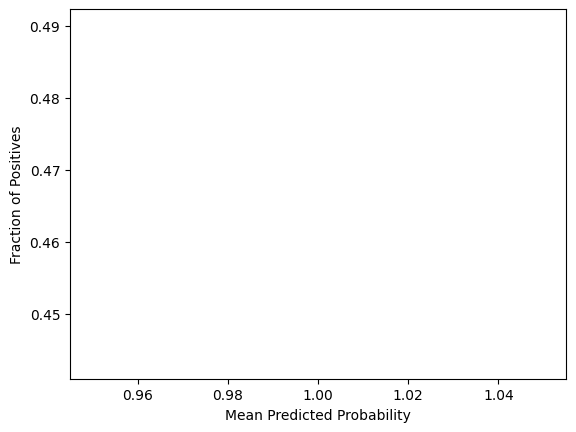

In [56]:
buildCC(target_test, test_preds)

In [57]:
#model_xgb.predict_proba(X_val)

In [58]:
model_xgb.best_estimator_.steps

[('encoder',
  TargetEncoder(cols=['thro_boarding_yn',
                      'con_max_consult_order_to_sign_is_signer_ym_provider_yn',
                      'con_max_consult_order_to_sign_is_signer_nemg_provider_yn',
                      'con_max_consult_order_to_sign_is_signer_community_provider_yn',
                      'con_max_consult_note_to_sign_is_signer_ym_provider_yn',
                      'con_max_consult_note_to_sign_is_signer_nemg_provider_yn',
                      'con_max_consult_note_to_sign_is_signer_community_provider_yn',
                      'icu_any_icu_yn'])),
 ('clf',
  XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=0.6301181140809947,
                colsample_bynode=0.7703817113387359,
                colsample_bytree=0.506103014140404, device=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, gamma=2.079165271399323,
              

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

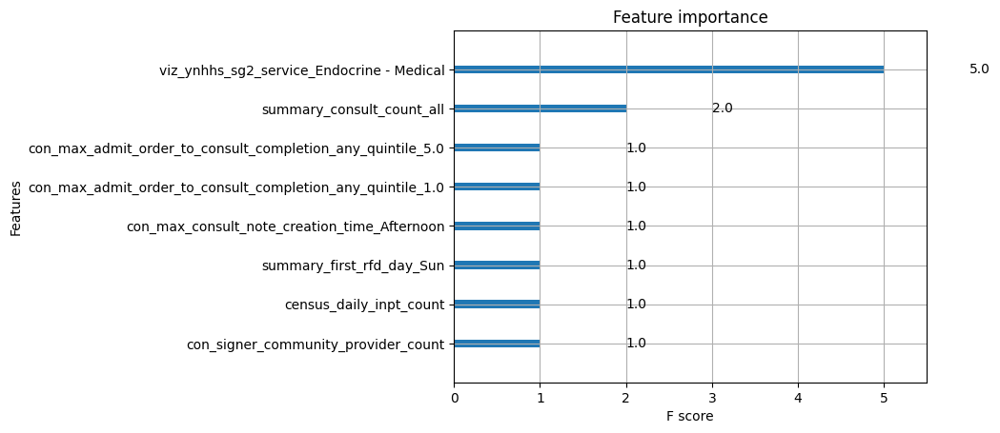

In [59]:
#https://www.youtube.com/watch?v=aLOQD66Sj0g&ab_channel=LianneandJustin
from xgboost import plot_importance

xgboost_step = model_xgb.best_estimator_.steps[1]
xgboost_model = xgboost_step[1]
plot_importance(xgboost_model, max_num_features=30)

In [60]:
xgboost_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.6301181140809947,
              colsample_bynode=0.7703817113387359,
              colsample_bytree=0.506103014140404, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=2.079165271399323,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0031574039841631043,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=8, ...)

In [61]:
X_train_selected = pd.read_csv('/gpfs/milgram/project/rtaylor/imc33/data/pipeline/los_train_initial_selected_byservice_patients_cat_only.csv', index_col=[0])

In [62]:
X_val_selected = pd.read_csv('/gpfs/milgram/project/rtaylor/imc33/data/pipeline/los_val_initial_selected_byservice_patients_cat_only.csv', index_col=[0])

In [63]:
clf_xgb = xgb.XGBClassifier(objective='binary:logistic', missing=None, seed=42)
clf_xgb.fit(X_train_selected, 
            y_train['viz_outcome_prolonged_los_yn'], 
            verbose=True,
            early_stopping_rounds=10,
            eval_metric='aucpr',
            eval_set=[(X_val_selected, y_val['viz_outcome_prolonged_los_yn'])])

[0]	validation_0-aucpr:0.54025
[1]	validation_0-aucpr:0.59574
[2]	validation_0-aucpr:0.69651
[3]	validation_0-aucpr:0.69770
[4]	validation_0-aucpr:0.68560
[5]	validation_0-aucpr:0.71240
[6]	validation_0-aucpr:0.67625
[7]	validation_0-aucpr:0.67707
[8]	validation_0-aucpr:0.65210
[9]	validation_0-aucpr:0.66679
[10]	validation_0-aucpr:0.66052
[11]	validation_0-aucpr:0.64514
[12]	validation_0-aucpr:0.65169
[13]	validation_0-aucpr:0.64425
[14]	validation_0-aucpr:0.64354


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=None, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [64]:
explainer = shap.Explainer(clf_xgb)
shap_values = explainer(X_val_selected)

In [65]:
#1 shap value for each feature
np.shape(shap_values.values)

(30, 336)

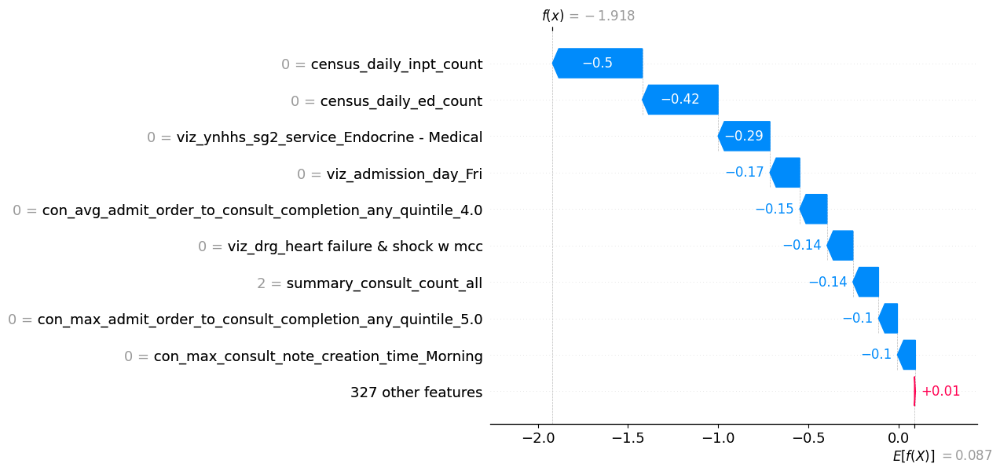

In [66]:
#This is for a single prediction
shap.plots.waterfall(shap_values[0])

In [67]:
shap.initjs(),
shap.plots.force(shap_values[0])

In [68]:
shap.plots.force(shap_values[0:100])

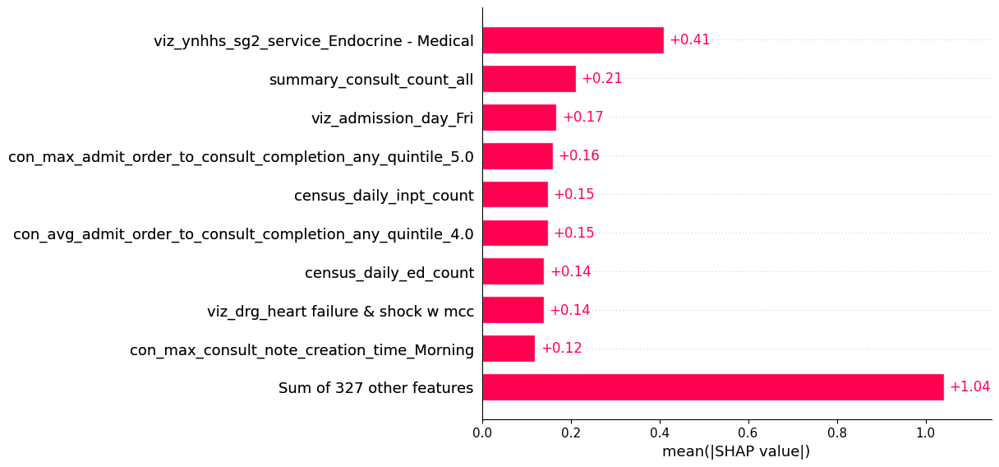

In [69]:
shap.plots.bar(shap_values)

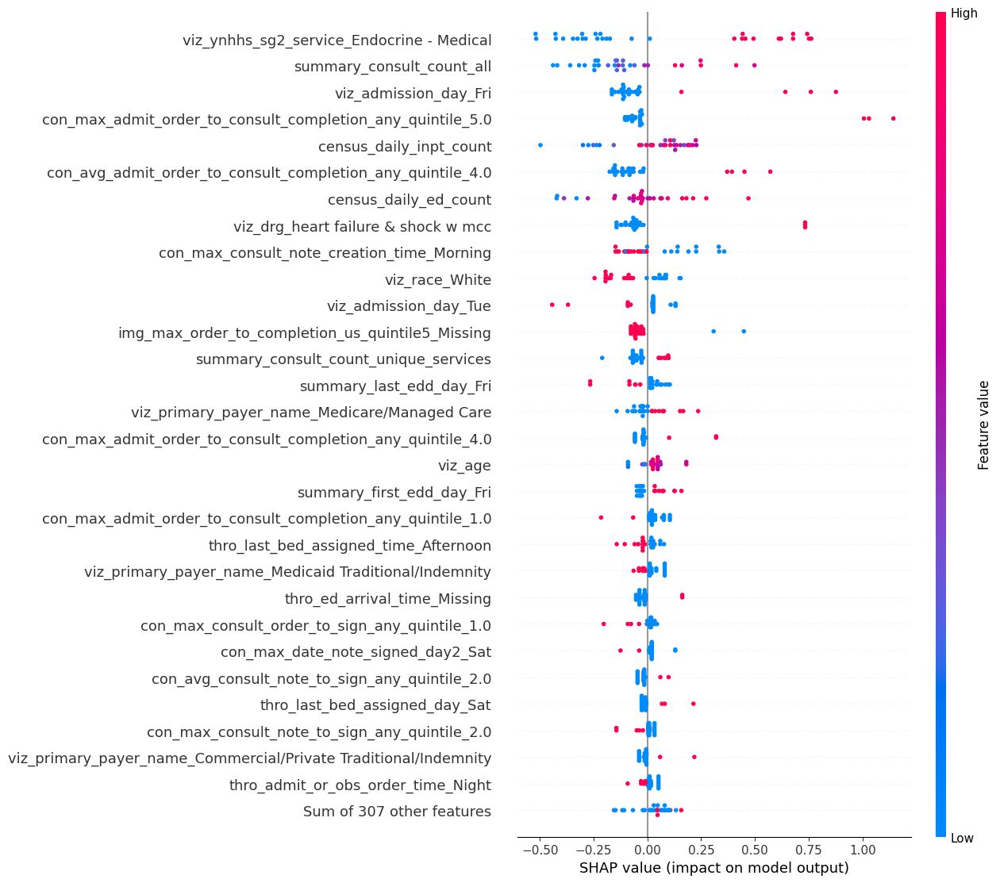

In [70]:
shap.plots.beeswarm(shap_values, max_display=30)